# Background
This notebook includes some initial exploration to find promising preprocessing methods to be used in ALL Detection. 

# Setup

In [ ]:
# Dependencies
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
# install kaggle
!pip install -q kaggle

# upload token
# kaggle account -> create new token
from google.colab import files
files.upload()

!mkdir ~/.kaggle             # make kaggle directory
!cp kaggle.json ~/.kaggle/   # copy kaggle.json in it
!chmod 600 ~/.kaggle/kaggle.json     # change permission

!kaggle datasets download -d mehradaria/leukemia
!unzip -q leukemia.zip -d leukemia

Saving kaggle.json to kaggle.json
 92% 102M/110M [00:01<00:00, 99.6MB/s]
100% 110M/110M [00:01<00:00, 97.0MB/s]


In [ ]:
# read image
img_path = '/content/leukemia/Original/Benign/WBC-Benign-001.jpg'
img = cv2.imread(img_path)

In [ ]:
img.shape

(224, 224, 3)

# Image in Different Color Spaces
Find a color space which accentuates the WBCs

In [ ]:
def display_img(img, title="", split_channels=False, channels=None):
  if split_channels:
    fig, axes = plt.subplots(1,4,figsize=(20,5))
    fig.subplots_adjust(top=0.8)
    axes[0].imshow(img)
    axes[0].set_title('Original')
    axes[1].imshow(img[:,:,0])
    axes[1].set_title(channels[0])
    axes[2].imshow(img[:,:,1])
    axes[2].set_title(channels[1])
    axes[3].imshow(img[:,:,2])
    axes[3].set_title(channels[2])
    fig.suptitle(title,y=0.95,fontsize=20,fontweight='bold')
  else:
    fig = plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(title, fontsize=20)
    plt.show()

In [ ]:
# Modified from Gary Milam
# https://github.com/OmdenaAI/irbrid-jordan-chapter-leukemia/blob/main/src/tasks/task-1-image-preprocessing/image-preprocessing-lab-watershed/Acute%20Lymphoblastic%20Leukemia%20Classifier.ipynb
def channel_hist(img,title="", channels=["blue","green","red"]):
    plt.figure(figsize=(10,6))
    for i in range(3):
        channel = channels[i]
        img_channel = img[:,:,i]
        if channel == "hue":
            hist = cv2.calcHist([img_channel], [0], mask = None, histSize = [180], ranges = [0,180])
        else:
            hist = cv2.calcHist([img_channel], [0], mask = None, histSize = [256], ranges = [0,256])
        plt.plot(hist, label=channel)
    plt.title(title,fontsize=20,fontweight='bold')
    plt.legend()
    plt.show()

## Original / RAW Image (RGB)

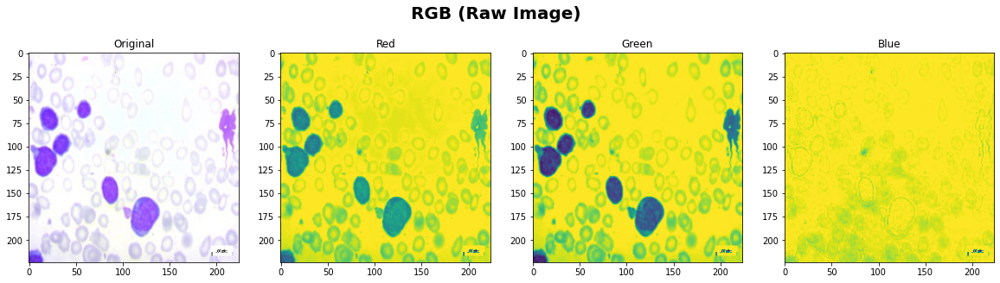

In [ ]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img(img_rgb,title='RGB (Raw Image)', split_channels=True, channels=['Red','Green','Blue'])

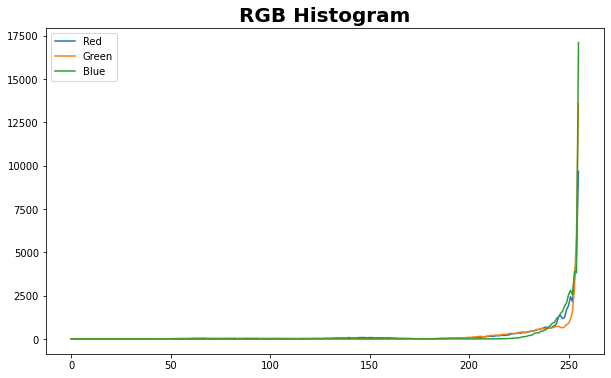

In [ ]:
channel_hist(img_rgb,title='RGB Histogram',channels=['Red','Green','Blue'])

## HSV

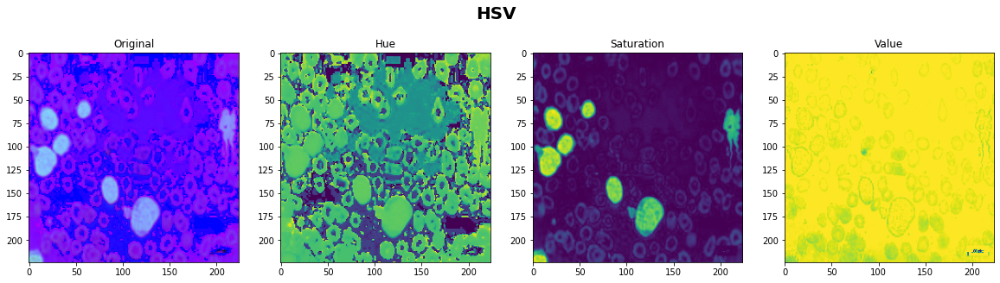

In [ ]:
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
display_img(img_hsv, title='HSV', split_channels=True, channels=['Hue','Saturation','Value'])

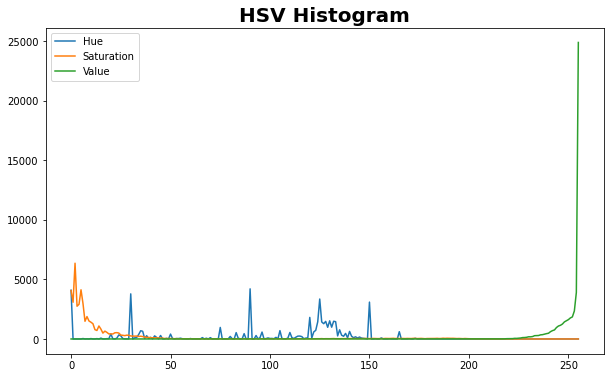

In [ ]:
channel_hist(img_hsv,title='HSV Histogram',channels=['Hue','Saturation','Value'])

## LAB

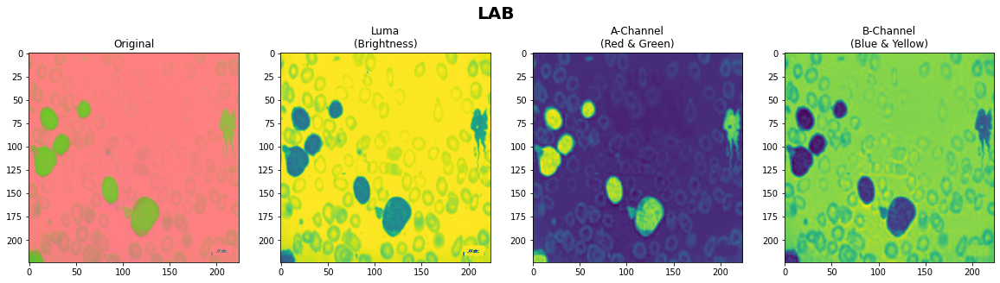

In [ ]:
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
display_img(img_lab,title='LAB', split_channels=True, channels=['Luma\n(Brightness)','A-Channel\n(Red & Green)','B-Channel\n(Blue & Yellow)'])

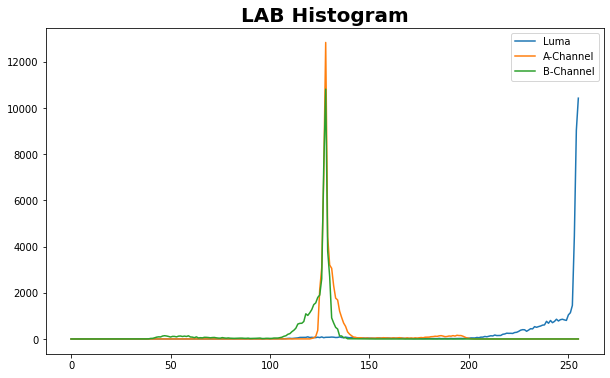

In [ ]:
channel_hist(img_lab,title='LAB Histogram',channels=['Luma','A-Channel','B-Channel'])

## YCrCb

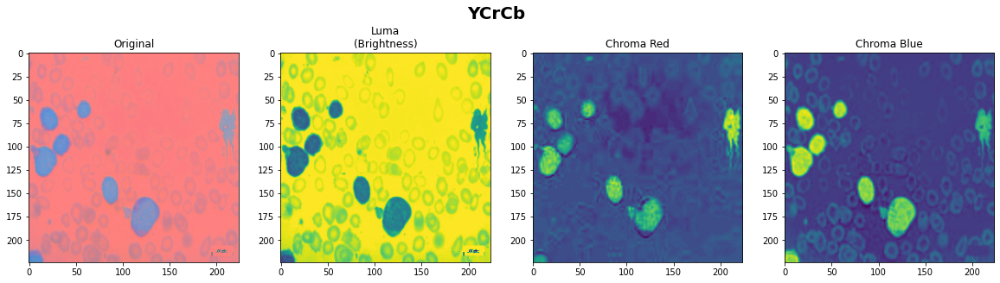

In [ ]:
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
display_img(img_ycrcb,title='YCrCb', split_channels=True, channels=['Luma\n(Brightness)','Chroma Red','Chroma Blue'])

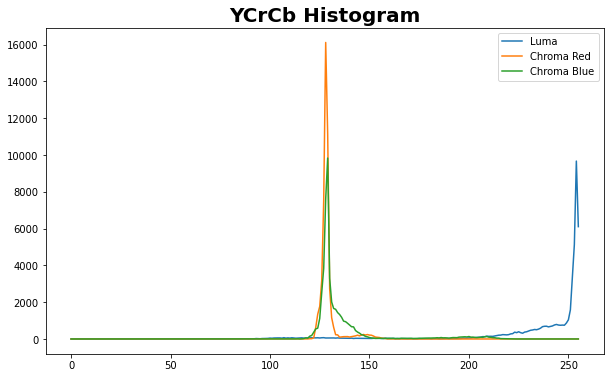

In [ ]:
channel_hist(img_ycrcb,title='YCrCb Histogram',channels=['Luma','Chroma Red','Chroma Blue'])

## LAB v. HSV
Both A-channel and S-channel quite clearly show the difference between WBC and RBC for this image. Here we compare these 2 color spaces.

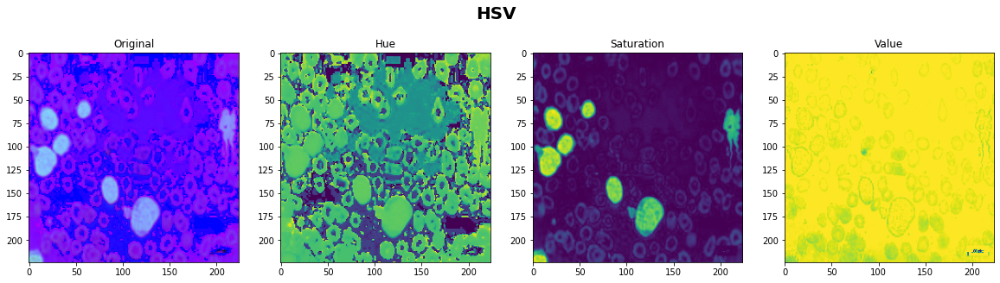

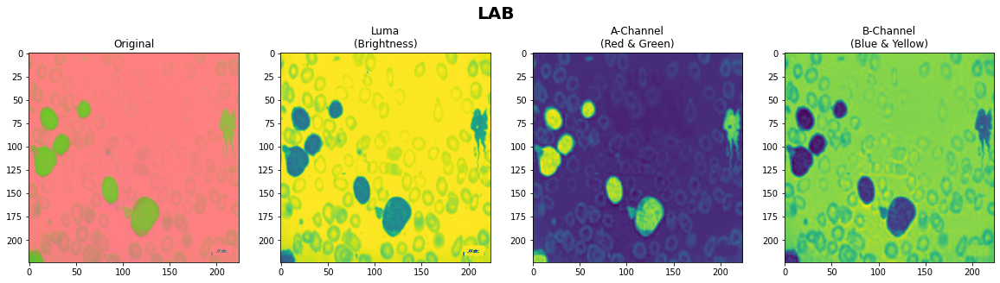

In [ ]:
display_img(img_hsv, title='HSV', split_channels=True, channels=['Hue','Saturation','Value'])
display_img(img_lab,title='LAB', split_channels=True, channels=['Luma\n(Brightness)','A-Channel\n(Red & Green)','B-Channel\n(Blue & Yellow)'])

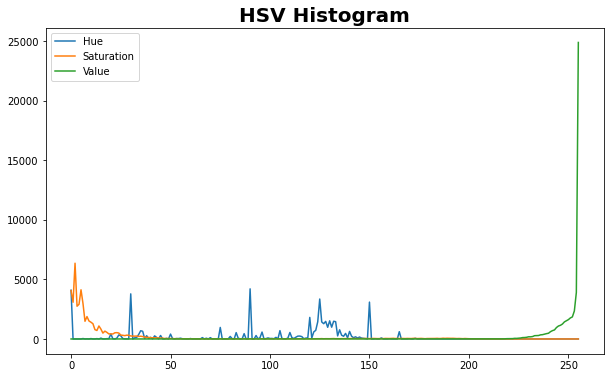

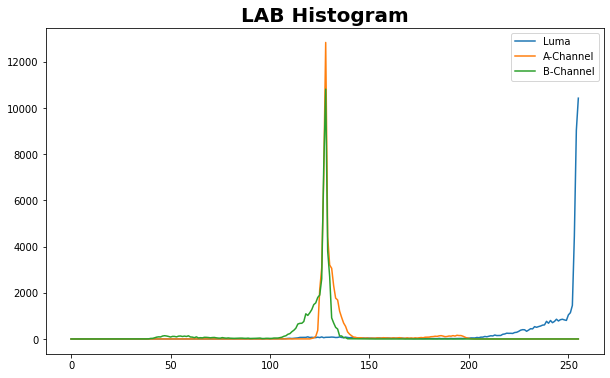

In [ ]:
channel_hist(img_hsv,title='HSV Histogram',channels=['Hue','Saturation','Value'])
channel_hist(img_lab,title='LAB Histogram',channels=['Luma','A-Channel','B-Channel'])

# Histogram Equalization
Histogram equalization will evenly distribute the intensity of the image

## LAB

In [ ]:
# LAB with Hist EQ
channels = cv2.split(img_lab)
cv2.equalizeHist(channels[0],channels[0])
img_lab_histeq = cv2.merge(channels)

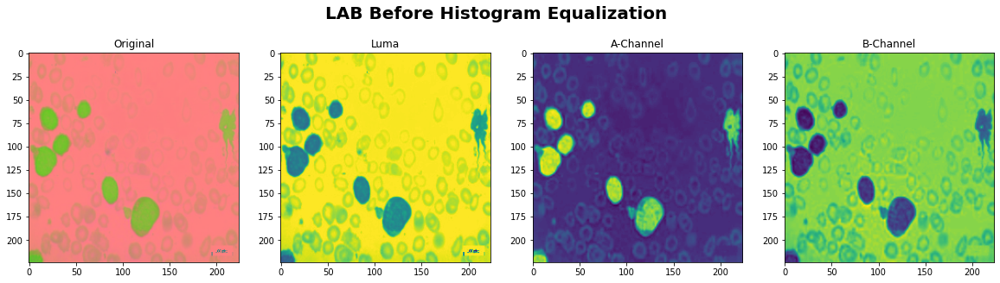

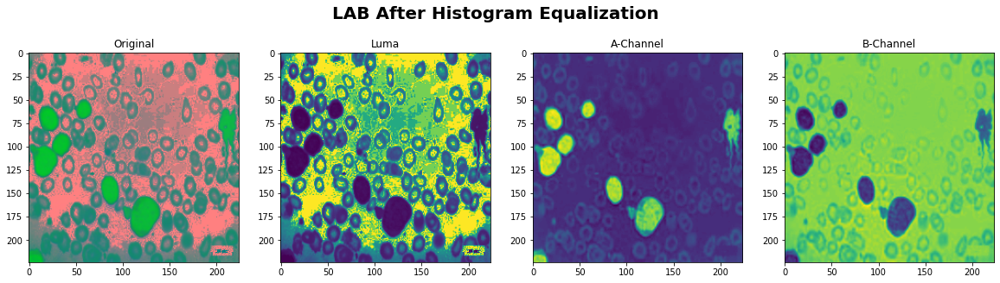

In [ ]:
display_img(img_lab,title='LAB Before Histogram Equalization',split_channels=True,channels=['Luma','A-Channel','B-Channel'])
display_img(img_lab_histeq,title='LAB After Histogram Equalization',split_channels=True,channels=['Luma','A-Channel','B-Channel'])

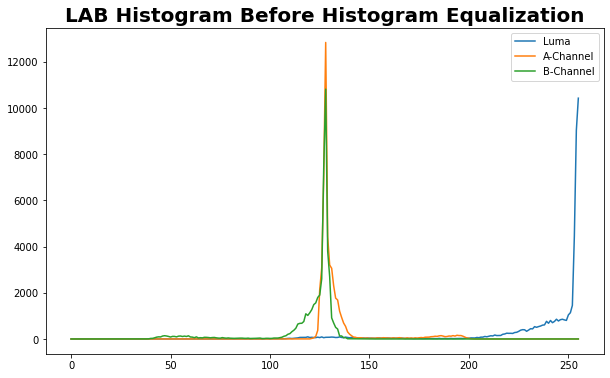

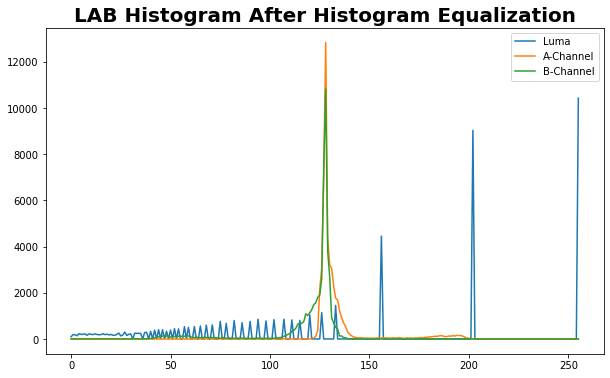

In [ ]:
channel_hist(img_lab,title='LAB Histogram Before Histogram Equalization',channels=['Luma','A-Channel','B-Channel'])
channel_hist(img_lab_histeq,title='LAB Histogram After Histogram Equalization',channels=['Luma','A-Channel','B-Channel'])

## HSV

In [ ]:
# Histogram Equalization on LAB then convert to HSV
img_rgb_histeq = cv2.cvtColor(img_lab_histeq, cv2.COLOR_LAB2RGB)
img_hsv_histeq = cv2.cvtColor(img_rgb_histeq, cv2.COLOR_RGB2HSV)

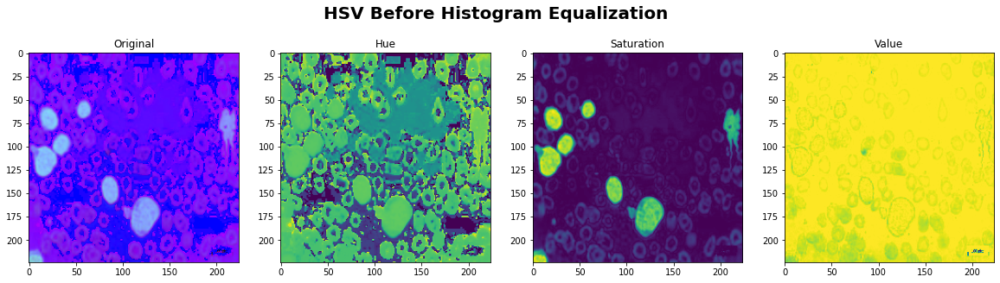

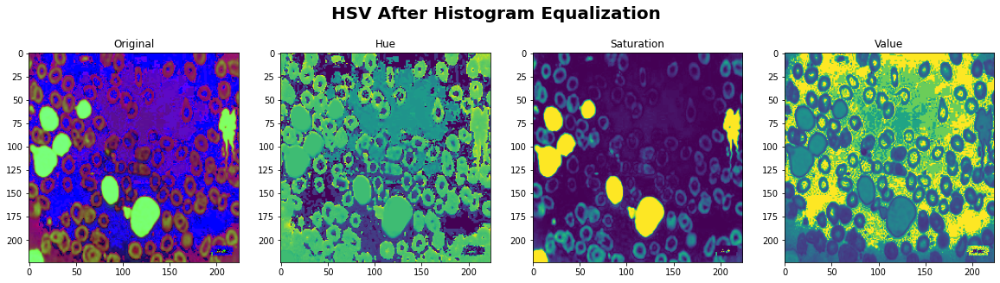

In [ ]:
display_img(img_hsv, title='HSV Before Histogram Equalization', split_channels=True, channels=['Hue','Saturation','Value'])
display_img(img_hsv_histeq, title='HSV After Histogram Equalization', split_channels=True, channels=['Hue','Saturation','Value'])

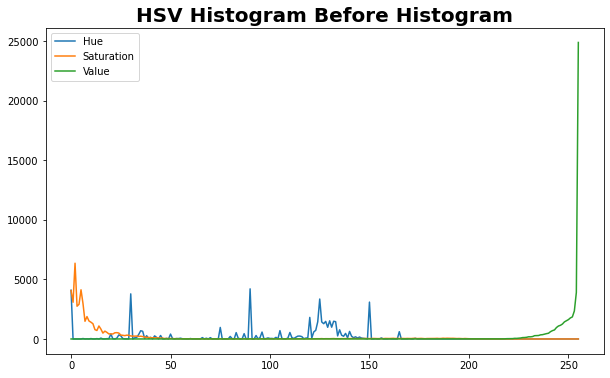

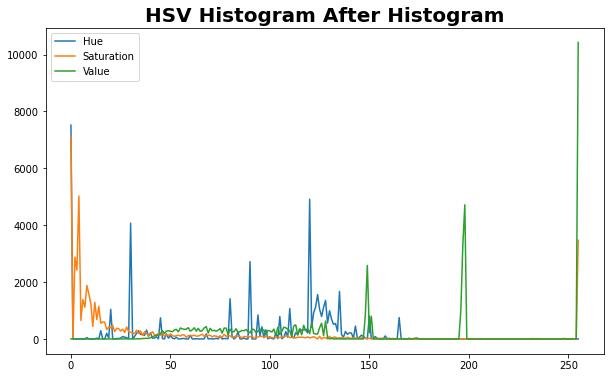

In [ ]:
channel_hist(img_hsv,title='HSV Histogram Before Histogram',channels=['Hue','Saturation','Value'])
channel_hist(img_hsv_histeq,title='HSV Histogram After Histogram',channels=['Hue','Saturation','Value'])

## RGB

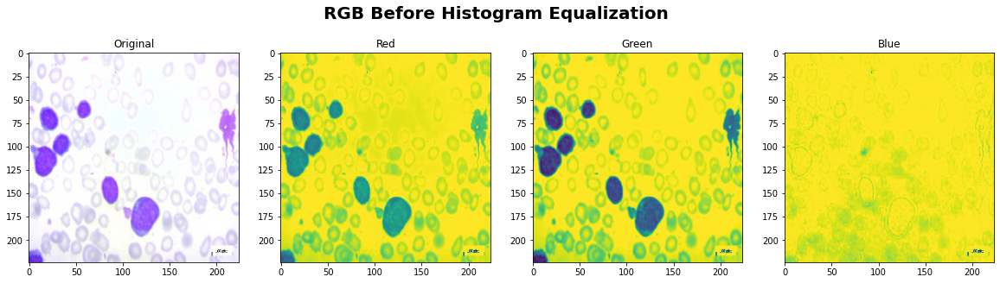

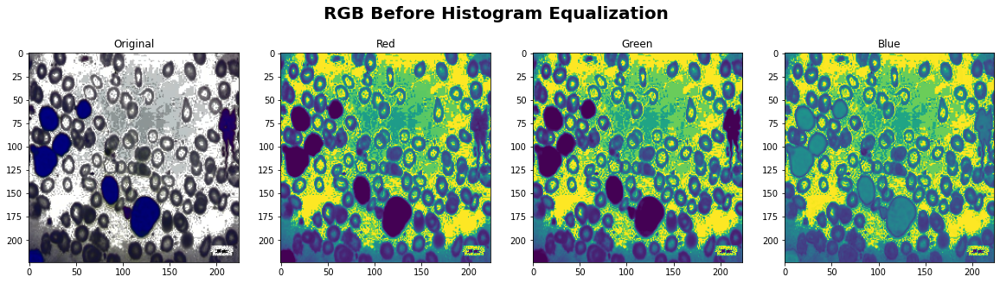

In [ ]:
display_img(img_rgb,title='RGB Before Histogram Equalization', split_channels=True, channels=['Red','Green','Blue'])
display_img(img_rgb_histeq,title='RGB Before Histogram Equalization', split_channels=True, channels=['Red','Green','Blue'])

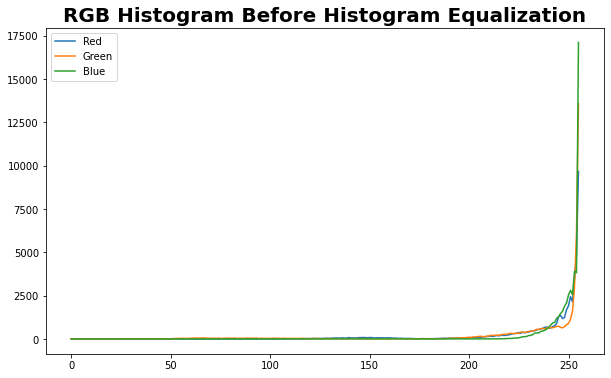

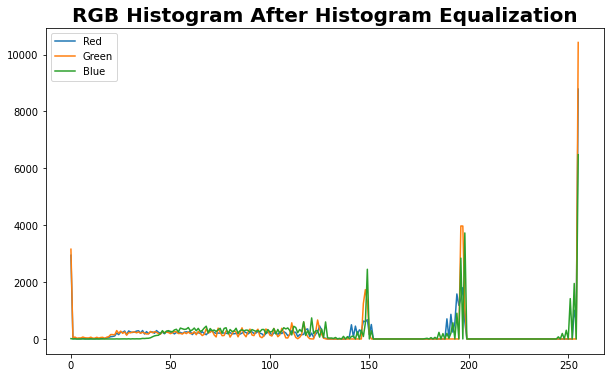

In [ ]:
channel_hist(img_rgb,title='RGB Histogram Before Histogram Equalization',channels=['Red','Green','Blue'])
channel_hist(img_rgb_histeq,title='RGB Histogram After Histogram Equalization',channels=['Red','Green','Blue'])

# Segmentation
- Thresholding
- Dilation
- Watershed

## See the effect of histogram equalization on thresholding

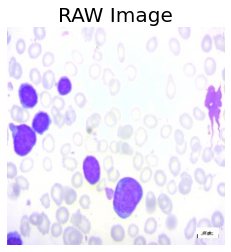

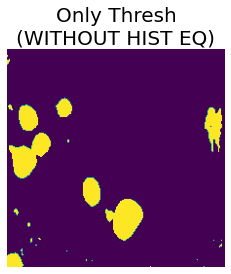

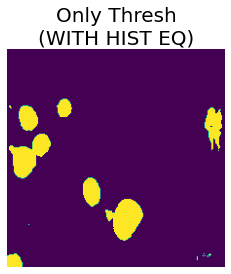

In [ ]:
# display original image as a comparison
display_img(img_rgb, 'RAW Image', split_channels=False)

# thresholding with focus on high saturation
# use image before histogram equalization
sat_hsv = img_hsv[:,:,1]
ret_hsv,th_hsv = cv2.threshold(sat_hsv,50,255,cv2.THRESH_BINARY)
display_img(th_hsv,"Only Thresh\n(WITHOUT HIST EQ)",split_channels=False)
# use image after histogram equalization
sat_hsv_histeq = img_hsv_histeq[:,:,1]
ret_hsv_histeq,th_hsv_histeq = cv2.threshold(sat_hsv_histeq,200,250,cv2.THRESH_BINARY)
display_img(th_hsv_histeq,"Only Thresh\n(WITH HIST EQ)",split_channels=False)

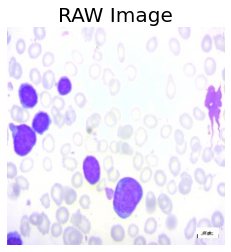

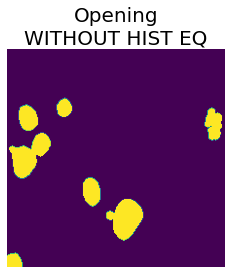

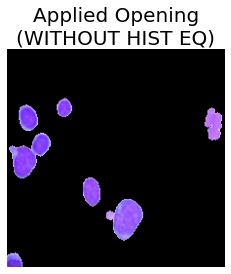

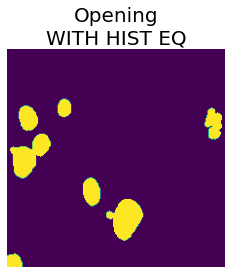

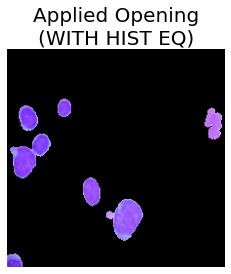

In [ ]:
# display original image as a comparison
display_img(img_rgb, 'RAW Image', split_channels=False)

# opening to remove specks 
kernel_opening = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
# use image before histogram equalization
opening_hsv = cv2.morphologyEx(th_hsv, cv2.MORPH_OPEN, kernel_opening)
display_img(opening_hsv, 'Opening\nWITHOUT HIST EQ', split_channels=False)
img_opening_hsv = cv2.bitwise_and(img_rgb,img_rgb,mask=opening_hsv)
display_img(img_opening_hsv, 'Applied Opening\n(WITHOUT HIST EQ)', split_channels=False)
# use image after histogram equalization
opening_hsv_histeq = cv2.morphologyEx(th_hsv_histeq, cv2.MORPH_OPEN, kernel_opening)
display_img(opening_hsv_histeq, 'Opening\nWITH HIST EQ', split_channels=False)
img_opening_hsv_histeq = cv2.bitwise_and(img_rgb,img_rgb,mask=opening_hsv_histeq)
display_img(img_opening_hsv_histeq, 'Applied Opening\n(WITH HIST EQ)', split_channels=False)

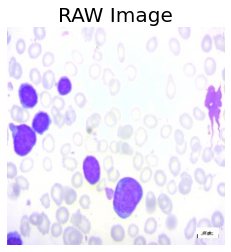

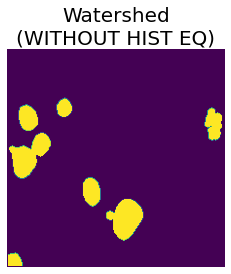

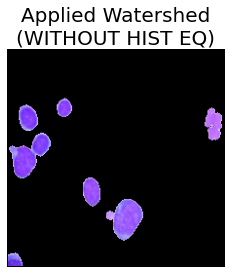

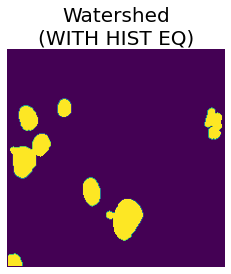

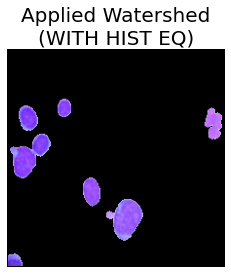

In [ ]:
# Modified from Gary Milam
# https://github.com/OmdenaAI/irbrid-jordan-chapter-leukemia/blob/main/src/tasks/task-1-image-preprocessing/image-preprocessing-lab-watershed/Acute%20Lymphoblastic%20Leukemia%20Classifier.ipynb
def watershed_img(opening,img):
  # dilation
  kernel_dilation = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20,20))
  dilated = cv2.dilate(opening, kernel_dilation)
  # watershed
  unknown = cv2.subtract(dilated,opening)
  markers = opening.astype('int32')
  markers[markers==225] = 1
  markers = markers+1           # +1 to all labels so that sure background is not 0, but 1
  markers[unknown==225] = 0     # mark the region of the unknown with zero
  finalmask = cv2.watershed(img,markers)
  finalmask[finalmask == 1] = 0
  finalmask[finalmask == -1] = 0
  finalmask[finalmask != 0] = 255
  return finalmask


# display original image as a comparison
display_img(img_rgb, 'RAW Image', split_channels=False)

# dilation -> watershed
# use image before histogram equalization
## watershed
finalmask_hsv = watershed_img(opening_hsv,img_rgb)
display_img(finalmask_hsv,'Watershed\n(WITHOUT HIST EQ)')
img_watershed_hsv = cv2.bitwise_and(img_rgb,img_rgb,mask=finalmask_hsv.astype(np.uint8))
display_img(img_watershed_hsv,'Applied Watershed\n(WITHOUT HIST EQ)')
# use image after histogram equalization
## watershed
finalmask_hsv_histeq = watershed_img(opening_hsv_histeq,img_rgb)
display_img(finalmask_hsv_histeq,'Watershed\n(WITH HIST EQ)')
img_watershed_hsv_histeq = cv2.bitwise_and(img_rgb,img_rgb,mask=finalmask_hsv_histeq.astype(np.uint8))
display_img(img_watershed_hsv_histeq,'Applied Watershed\n(WITH HIST EQ)')

# Try procedures on more images

In [ ]:
def hist_eq(img):
  img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
  channels = cv2.split(img_lab)
  cv2.equalizeHist(channels[0],channels[0])
  img_lab_histeq = cv2.merge(channels)
  img_rgb_histeq = cv2.cvtColor(img_lab_histeq, cv2.COLOR_LAB2RGB)
  img_hsv_histeq = cv2.cvtColor(img_rgb_histeq, cv2.COLOR_RGB2HSV)
  return img_hsv_histeq


def thresh(img,boundary=[0,0]):
  sat_hsv = img[:,:,1]
  ret_hsv,th_hsv = cv2.threshold(sat_hsv,boundary[0],boundary[1],cv2.THRESH_BINARY)
  return th_hsv


def opening(img):
  kernel_opening = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
  opening_hsv = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel_opening)
  return opening_hsv



def segment_img(img,class_name):
  fig, axes = plt.subplots(nrows=7,ncols=3,figsize=(9,21))

  # raw RGB
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  lst = [0,2,4,6]
  for i in lst:
    axes[i][0].imshow(img_rgb)
    axes[i][0].set_title('RGB')
  lst_empty = [1,3,5]
  for i in lst_empty:
    axes[i][0].set_axis_off()

  # HSV without HistEQ
  img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  axes[0][1].imshow(img_hsv)
  axes[0][1].set_title('HSV\nWithout Hist Eq.')

  # HSV with HistEq
  img_hsv_histeq = hist_eq(img)
  axes[0][2].imshow(img_hsv_histeq)
  axes[0][2].set_title('HSV\nWith Hist Eq')

  # [NO-HISTEQ] thresholding mask
  th_hsv = thresh(img_hsv,boundary=[60,255])
  axes[1][1].imshow(th_hsv)
  axes[1][1].set_title('Thresholding Mask')
  # apply
  img_th_hsv = cv2.bitwise_and(img_rgb,img_rgb,mask=th_hsv)
  axes[2][1].imshow(img_th_hsv)
  axes[2][1].set_title('Applied\nthresholding mask')

  # [HISTEQ] thresholding mask
  th_hsv_histeq = thresh(img_hsv_histeq,boundary=[150,255])
  axes[1][2].imshow(th_hsv_histeq)
  axes[1][2].set_title('Thresholding mask')
  # apply
  img_th_hsv_histeq = cv2.bitwise_and(img_rgb,img_rgb,mask=th_hsv_histeq)
  axes[2][2].imshow(img_th_hsv_histeq)
  axes[2][2].set_title('Applied\nthresholding mask')

  # [NO-HISTEQ] thresholding+opening mask
  op_hsv = opening(th_hsv)
  axes[3][1].imshow(op_hsv)
  axes[3][1].set_title('+Opening mask')
  # apply
  img_op_hsv = cv2.bitwise_and(img_rgb,img_rgb,mask=op_hsv)
  axes[4][1].imshow(img_op_hsv)
  axes[4][1].set_title('Applied\n+Opening mask')

  # [HISTEQ] thresholding+opening mask
  op_hsv_histeq = opening(th_hsv_histeq)
  axes[3][2].imshow(op_hsv_histeq)
  axes[3][2].set_title('+Opening mask')
  # apply
  img_op_hsv_histeq = cv2.bitwise_and(img_rgb,img_rgb,mask=op_hsv_histeq)
  axes[4][2].imshow(img_op_hsv_histeq)
  axes[4][2].set_title('Applied\n+Opening mask')

  # [NO-HISTEQ] thresholding+opening+watershed mask
  watershed_hsv = watershed_img(op_hsv,img_rgb)
  axes[5][1].imshow(watershed_hsv)
  axes[5][1].set_title('+Watershed mask')
  # apply
  img_watershed_hsv = cv2.bitwise_and(img_rgb,img_rgb,mask=watershed_hsv.astype(np.uint8))
  axes[6][1].imshow(img_watershed_hsv)
  axes[6][1].set_title('Applied\n+Watershed mask')

  # [HISTEQ] thresholding+opening+watershed mask
  watershed_hsv_histeq = watershed_img(op_hsv_histeq,img_rgb)
  axes[5][2].imshow(watershed_hsv_histeq)
  axes[5][2].set_title('+Watershed mask')
  # apply
  img_watershed_hsv_histeq = cv2.bitwise_and(img_rgb,img_rgb,mask=watershed_hsv_histeq.astype(np.uint8))
  axes[6][2].imshow(img_watershed_hsv_histeq)
  axes[6][2].set_title('Applied\n+Watershed mask')

  fig.subplots_adjust(top=1)
  fig.suptitle(class_name,fontweight='bold',fontsize=20,y=1.02)
  fig.tight_layout()
  plt.show()

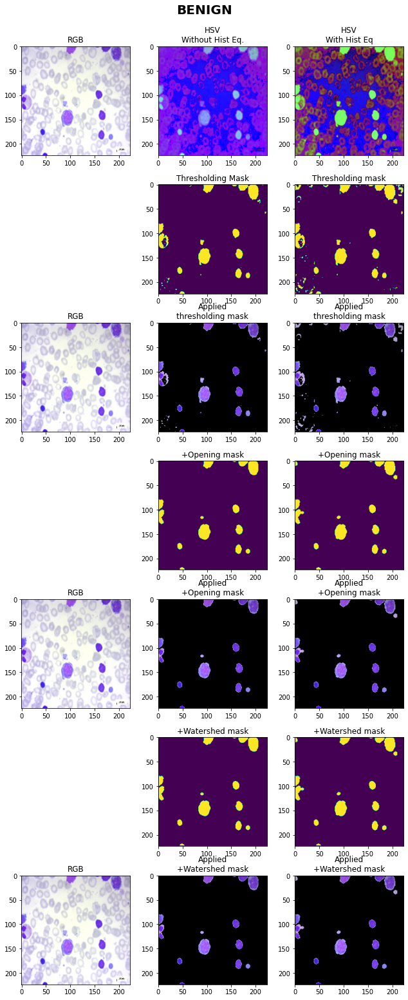

In [ ]:
# benign sample
img_benign = cv2.imread('/content/leukemia/Original/Benign/WBC-Benign-010.jpg')
segment_img(img_benign,'BENIGN')

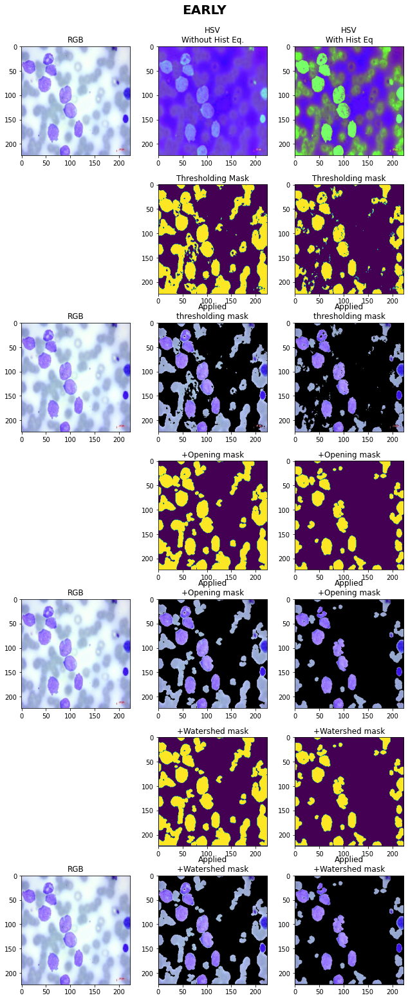

In [ ]:
# sample early
img_early = cv2.imread('/content/leukemia/Original/Early/WBC-Malignant-Early-021.jpg')
segment_img(img_early,'EARLY')

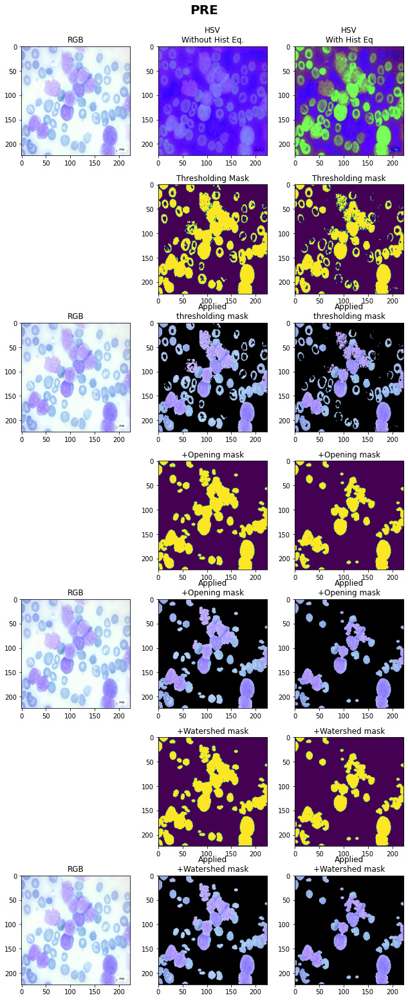

In [ ]:
# sample pre
img_pre = cv2.imread('/content/leukemia/Original/Pre/WBC-Malignant-Pre-008.jpg')
segment_img(img_pre,'PRE')

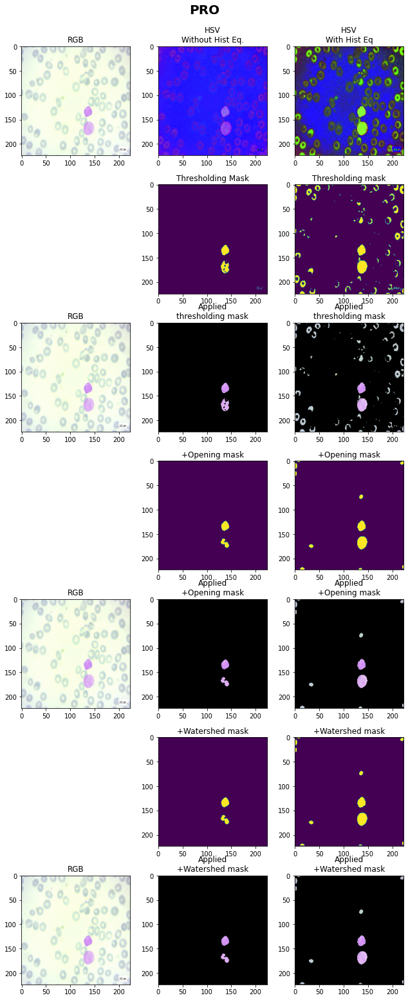

In [ ]:
# sample pro
img_pro = cv2.imread('/content/leukemia/Original/Pro/WBC-Malignant-Pro-009.jpg')
segment_img(img_pro,'PRO')

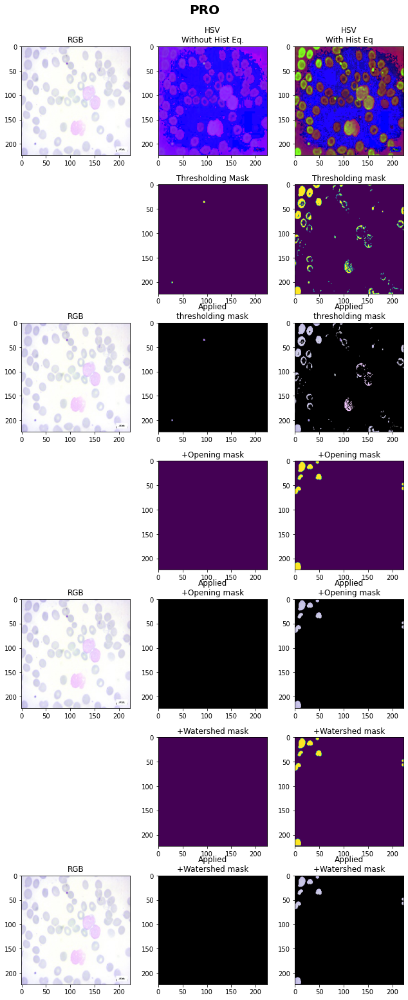

In [ ]:
# sample pro
img_pro = cv2.imread('/content/leukemia/Original/Pro/WBC-Malignant-Pro-051.jpg')
segment_img(img_pro,'PRO')

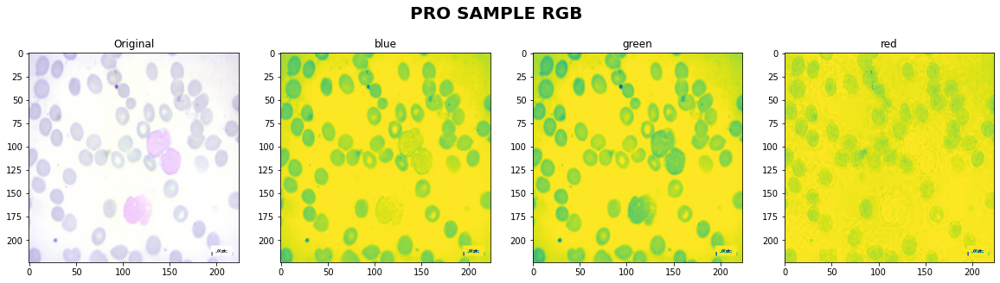

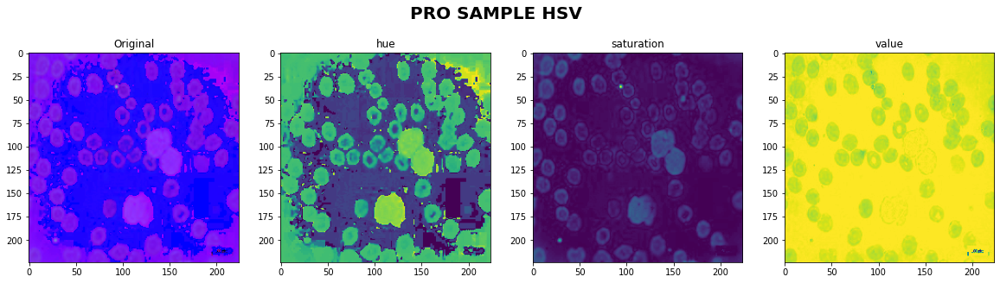

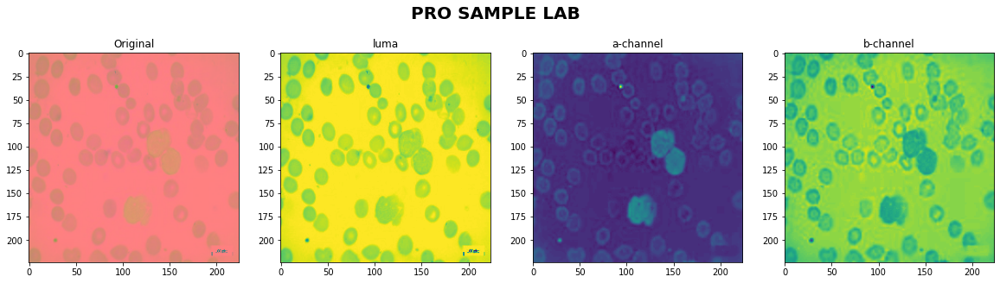

In [ ]:
img_pro_rgb = cv2.cvtColor(img_pro, cv2.COLOR_BGR2RGB)
display_img(img_pro_rgb,'PRO SAMPLE RGB',split_channels=True,channels=['blue','green','red'])
img_pro_hsv = cv2.cvtColor(img_pro, cv2.COLOR_BGR2HSV)
display_img(img_pro_hsv,'PRO SAMPLE HSV',split_channels=True,channels=['hue','saturation','value'])
img_pro_lab = cv2.cvtColor(img_pro, cv2.COLOR_BGR2LAB)
display_img(img_pro_lab,'PRO SAMPLE LAB',split_channels=True,channels=['luma','a-channel','b-channel'])

# Conclusion
Viable preprocessing options:
- (no-segment) raw rgb image
- (no-segment) hsv image, with hist equ
- (segment) mask [s-channel, without hist equ, without watershed] -> apply mask
- (segment) mask [s-channel, without hist equ, with watershed] -> apply mask
- (segment) mask [s-channel, with hist equ, without watershed] -> apply mask
- (segment) mask [s-channel, with hist equ, with watershed] -> apply mask
- (segment) mask [a-channel, with watershed] -> apply mask